# **Cyclstic - Google Data Analytics Certificate**.  
## *Capstone Case study 1 in R and Tableau*

This is originally based on the case study "'Sophisticated, Clear, and Polished’: Divvy and Data Visualization" written by Kevin Hartman 

In this case study I have followed the Google's Data Analytics 6 Step Process:
1. ASK 
2. PREPARE
3. PROCESS
4. ANALYZE
5. SHARE
6. ACT

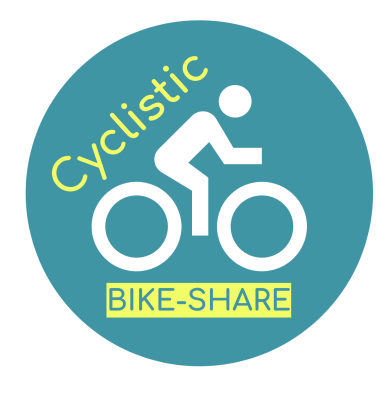

# Table of Contents
1. [Background](#background)
2. [Ask](#ask)
3. [Prepare](#prep)
4. [Process](#proc)
5. [Analyze](#ana)
6. [Share](#shar)
7. [Act/Summary](#act)
8. [Conclusion](#con)



## **<a id="background">1. BACKGROUND </a>**

Cyclistic is a fictional bike-share company in Chicago. The director of
marketing believes the company’s future success depends on maximizing the number of annual memberships. Therefore, we want to understand how casual riders and annual members use Cyclistic bikes diŦerently. From these insights, we will design a new marketing strategy to convert casual riders into annual members. 

## **<a id="ask">2. ASK </a>**

*Key aim of this phase is to understand the key business problem and understand the stakeholders involved the project.*

**Business Task** Idetintifying the key differences between casual riders and members

**StakeHolders:** 
1. Lily Moreno: The director of marketing
2. Cyclistic marketing analytics team

## **<a id="prep">3. PREPARE</a>**

*Aim of this phase is to indentify the source of data, see if the data is reliable, original, comprehensive, current and cited (ROCCC). Also to  understand how the data is organized.*


The case originally based on the case study "'Sophisticated, Clear, and Polished’: Divvy and Data Visualization" written by Kevin Hartman ([found here: https://artscience.blog/home/divvy-dataviz-case-study)](http://). We will be using the Divvy dataset for this case study.

I  downloaded the dataset from [link](https://divvy-tripdata.s3.amazonaws.com/index.html).The data has been made available by Motivate International Inc. under  this [license](https://divvybikes.com/data-license-agreement).

For the purposes of this study, I will be using dataset from JUNE 2022 to NOV 2023 (1.5 Years). The 18 (.csv) files were downlaoded to the local disk.
Data was collected by divvy bikesharing company  and is current.

First we will import the dataset in R.

In [ ]:
# import all the necessary libraries to 
library(tidyverse)  #helps wrangle data
library(lubridate)  #helps wrangle date attributes
library(ggplot2)  #helps visualize data
library(dplyr) 
library(purrr)
library(geosphere)

getwd() #displays your working directory


In [3]:
# Using a pipe to import all the datasets into one dataframe fil
data_all <- list.files(path="/input/divvy-dataset", pattern=".csv") %>% #get all the csv files
            lapply(read_csv)                             # read the files 
                                               

Rows: 769204 Columns: 13
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr  (7): ride_id, rideable_type, start_station_name, start_station_id, end_...
dbl  (4): start_lat, start_lng, end_lat, end_lng
dttm (2): started_at, ended_at

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
Rows: 823488 Columns: 13
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr  (7): ride_id, rideable_type, start_station_name, start_station_id, end_...
dbl  (4): start_lat, start_lng, end_lat, end_lng
dttm (2): started_at, ended_at

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
Rows: 785932 Columns: 13
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr  (7

Let's view the data and do preliminary checks namely:
1. Figuring out how the data is organized 
2. We must check whether Column names match in all the files


In [ ]:
##To view the data
head(data_all) # to view the first 6 rows of the data 
tail(data_all) # to view the last 6 rows of the data

In [4]:
# To check if the column names are same in all the files
col_same <- lapply(data_all,colnames) %>%
            unique() %>%
            length()
if (col_same == 1) { 
    print("Column names match across all the files")
    } else {
    print(" Column names are different across files")
    }

[1] "Column names match across all the files"


Now, we can combine all the data into single dataframe across the all the months. After that we can move onto Process Phase of this analysis. *In my case, I will be using the data from Jun 2022 to Nov 2023 - 1.5 years.*

In [5]:
data_comb <- bind_rows(data_all) #Combining by binding all the rows
head(data_comb)                  # View the data
tail(data_comb)

ride_id,rideable_type,started_at,ended_at,start_station_name,start_station_id,end_station_name,end_station_id,start_lat,start_lng,end_lat,end_lng,member_casual
<chr>,<chr>,<dttm>,<dttm>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
600CFD130D0FD2A4,electric_bike,2022-06-30 17:27:53,2022-06-30 17:35:15,NA,NA,NA,NA,41.89,-87.62,41.91,-87.62,casual
F5E6B5C1682C6464,electric_bike,2022-06-30 18:39:52,2022-06-30 18:47:28,NA,NA,NA,NA,41.91,-87.62,41.93,-87.63,casual
B6EB6D27BAD771D2,electric_bike,2022-06-30 11:49:25,2022-06-30 12:02:54,NA,NA,NA,NA,41.91,-87.65,41.89,-87.61,casual
C9C320375DE1D5C6,electric_bike,2022-06-30 11:15:25,2022-06-30 11:19:43,NA,NA,NA,NA,41.80,-87.66,41.80,-87.65,casual
56C055851023BE98,electric_bike,2022-06-29 23:36:50,2022-06-29 23:45:17,NA,NA,NA,NA,41.91,-87.63,41.93,-87.64,casual
B664188E8163D045,electric_bike,2022-06-30 16:42:10,2022-06-30 16:58:22,NA,NA,NA,NA,42.03,-87.71,42.06,-87.73,casual


ride_id,rideable_type,started_at,ended_at,start_station_name,start_station_id,end_station_name,end_station_id,start_lat,start_lng,end_lat,end_lng,member_casual
<chr>,<chr>,<dttm>,<dttm>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
B80D6930328640ED,classic_bike,2023-11-03 17:04:45,2023-11-03 17:07:50,Aberdeen St & Jackson Blvd,13157,Peoria St & Jackson Blvd,13158,41.87773,-87.65479,41.87764,-87.64962,member
30B44BD4C16E688C,classic_bike,2023-11-24 08:39:27,2023-11-24 08:47:03,Clark St & Wellington Ave,TA1307000136,Southport Ave & Wellington Ave,TA1307000006,41.93650,-87.64754,41.93577,-87.66360,member
094A79892812BAB9,classic_bike,2023-11-06 09:07:20,2023-11-06 09:10:00,Aberdeen St & Jackson Blvd,13157,Peoria St & Jackson Blvd,13158,41.87773,-87.65479,41.87764,-87.64962,member
F0A7DF8A44FDA3CB,electric_bike,2023-11-10 19:35:30,2023-11-10 19:44:28,Halsted St & Roscoe St,TA1309000025,Southport Ave & Wellington Ave,TA1307000006,41.94369,-87.64886,41.93577,-87.66360,member
4D5E3685BB913A3C,classic_bike,2023-11-27 09:11:23,2023-11-27 09:13:23,Aberdeen St & Jackson Blvd,13157,Peoria St & Jackson Blvd,13158,41.87773,-87.65479,41.87764,-87.64962,member
1FA95C375BE4B6A6,electric_bike,2023-11-20 16:16:03,2023-11-20 16:17:43,Aberdeen St & Jackson Blvd,13157,Peoria St & Jackson Blvd,13158,41.87787,-87.65490,41.87764,-87.64962,member


## **<a id="ask">4. PROCESS</a>**

*In this phase, the aim is to check the data for errors, clean and organzize the data and select the right tools for further analysis. 

Now that we have got all the data in one table (dataframe), we can start the processing the data. 
The data cleaning process involves:
1. Create additional columns 
    1. Convert the start DateTime columns to Day, Month, Year & Time columns.
    2. Convert the Member_Casual column to categorical (member_casual1)
    3. Calculate ride duration (ride_len) of the ride. 
    3. Calculate distances based on longitudes and latitudes.
2. Checking for duplicates
3. Sanity checks
4. Plotting the ride length as histogram
5. Outlier detection
6. Further explore the outliers
7. Prepare the data for analysis


In [6]:
#Summary numbers
colnames(data_comb)  #List of column names
nrow(data_comb)  #How many rows are in data frame?
dim(data_comb)  #Dimensions of the data frame?
summary(data_comb)  #Statistical summary of data. Mainly for numerics
df <- data_comb
glimpse(df)

[1] "ride_id"            "rideable_type"      "started_at"        
 [4] "ended_at"           "start_station_name" "start_station_id"  
 [7] "end_station_name"   "end_station_id"     "start_lat"         
[10] "start_lng"          "end_lat"            "end_lng"           
[13] "member_casual"

[1] 9653993

[1] 9653993      13

   ride_id          rideable_type        started_at                 
 Length:9653993     Length:9653993     Min.   :2022-06-01 00:00:04  
 Class :character   Class :character   1st Qu.:2022-09-02 13:11:16  
 Mode  :character   Mode  :character   Median :2023-04-04 08:02:19  
                                       Mean   :2023-02-22 16:38:33  
                                       3rd Qu.:2023-07-29 12:20:21  
                                       Max.   :2023-11-30 23:59:14  
                                                                    
    ended_at                   start_station_name start_station_id  
 Min.   :2022-06-01 00:02:38   Length:9653993     Length:9653993    
 1st Qu.:2022-09-02 13:29:55   Class :character   Class :character  
 Median :2023-04-04 08:13:11   Mode  :character   Mode  :character  
 Mean   :2023-02-22 16:57:28                                        
 3rd Qu.:2023-07-29 12:44:56                                        
 Max.   :2023-12-01 20:42:31      

Rows: 9,653,993
Columns: 13
$ ride_id            <chr> "600CFD130D0FD2A4", "F5E6B5C1682C6464", "B6EB6D27BA…
$ rideable_type      <chr> "electric_bike", "electric_bike", "electric_bike", …
$ started_at         <dttm> 2022-06-30 17:27:53, 2022-06-30 18:39:52, 2022-06-…
$ ended_at           <dttm> 2022-06-30 17:35:15, 2022-06-30 18:47:28, 2022-06-…
$ start_station_name <chr> NA, NA, NA, NA, NA, NA, NA, NA, NA, NA, NA, NA, NA,…
$ start_station_id   <chr> NA, NA, NA, NA, NA, NA, NA, NA, NA, NA, NA, NA, NA,…
$ end_station_name   <chr> NA, NA, NA, NA, NA, NA, NA, NA, NA, NA, NA, NA, NA,…
$ end_station_id     <chr> NA, NA, NA, NA, NA, NA, NA, NA, NA, NA, NA, NA, NA,…
$ start_lat          <dbl> 41.89, 41.91, 41.91, 41.80, 41.91, 42.03, 41.91, 41…
$ start_lng          <dbl> -87.62, -87.62, -87.65, -87.66, -87.63, -87.71, -87…
$ end_lat            <dbl> 41.91, 41.93, 41.89, 41.80, 41.93, 42.06, 41.92, 41…
$ end_lng            <dbl> -87.62, -87.63, -87.61, -87.65, -87.64, -87.73, -87…
$ member_cas

In [7]:
#Fisrtly lets add extra columns like sperate time and date
df$date <- as.Date(df$started_at) 
df$month <- format(as.Date(df$date), "%m")
df$day <- format(as.Date(df$date), "%d")
df$year <- format(as.Date(df$date), "%Y")
df$day_of_week <- format(as.Date(df$date), "%A")

# To figure out ride length
df$ride_len <-  difftime(df$ended_at,df$started_at)

#make the rider_type and rideable_type as factors
df$member_casual1 <- as.factor(df$member_casual)
df$bike_type <- as.factor(df$rideable_type)

#
df <- df %>%
    rowwise%>%
    mutate(distance=distm(x=c(start_lng,start_lat),
                               y=c(end_lng,end_lat)))

ride_id,rideable_type,started_at,ended_at,start_station_name,start_station_id,end_station_name,end_station_id,start_lat,start_lng,⋯,member_casual,date,month,day,year,day_of_week,ride_len,member_casual1,bike_type,distance
<chr>,<chr>,<dttm>,<dttm>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,⋯,<chr>,<date>,<chr>,<chr>,<chr>,<chr>,<drtn>,<fct>,<fct>,"<dbl[,1]>"
600CFD130D0FD2A4,electric_bike,2022-06-30 17:27:53,2022-06-30 17:35:15,NA,NA,NA,NA,41.89,-87.62,⋯,casual,2022-06-30,06,30,2022,Thursday,442 secs,casual,electric_bike,2221.4268
F5E6B5C1682C6464,electric_bike,2022-06-30 18:39:52,2022-06-30 18:47:28,NA,NA,NA,NA,41.91,-87.62,⋯,casual,2022-06-30,06,30,2022,Thursday,456 secs,casual,electric_bike,2371.2688
B6EB6D27BAD771D2,electric_bike,2022-06-30 11:49:25,2022-06-30 12:02:54,NA,NA,NA,NA,41.91,-87.65,⋯,casual,2022-06-30,06,30,2022,Thursday,809 secs,casual,electric_bike,3993.9853
C9C320375DE1D5C6,electric_bike,2022-06-30 11:15:25,2022-06-30 11:19:43,NA,NA,NA,NA,41.80,-87.66,⋯,casual,2022-06-30,06,30,2022,Thursday,258 secs,casual,electric_bike,831.0969
56C055851023BE98,electric_bike,2022-06-29 23:36:50,2022-06-29 23:45:17,NA,NA,NA,NA,41.91,-87.63,⋯,casual,2022-06-29,06,29,2022,Wednesday,507 secs,casual,electric_bike,2371.2688
B664188E8163D045,electric_bike,2022-06-30 16:42:10,2022-06-30 16:58:22,NA,NA,NA,NA,42.03,-87.71,⋯,casual,2022-06-30,06,30,2022,Thursday,972 secs,casual,electric_bike,3720.9611
338C05A3E90D619B,electric_bike,2022-06-30 18:39:07,2022-06-30 19:05:02,NA,NA,NA,NA,41.91,-87.63,⋯,casual,2022-06-30,06,30,2022,Thursday,1555 secs,casual,electric_bike,7548.6465
C037F5F4107788DE,electric_bike,2022-06-30 12:46:14,2022-06-30 14:12:48,NA,NA,NA,NA,41.89,-87.62,⋯,casual,2022-06-30,06,30,2022,Thursday,5194 secs,casual,electric_bike,10822.4389
C19B08D794D1C89E,electric_bike,2022-06-30 11:09:38,2022-06-30 11:10:25,NA,NA,NA,NA,41.89,-87.61,⋯,casual,2022-06-30,06,30,2022,Thursday,47 secs,casual,electric_bike,0.0000


In [ ]:
## Save the preprocesed data into to a csv file, so that we can load the dataframe

#write.csv(df,"data_processed_rf1.csv", row.names=FALSE)
#df <- read_csv("/data-preprocessed/data_processed_rf1.csv")

In [4]:
# as the first thing we can do is check for duplicates in our ride-id
length(df$ride_id) == length(unique(df$ride_id))

[1] TRUE

Here all the entries(ride-id) are distinct and no duplicates were found.

In [5]:
# sanity checks
unique(df$bike_type) #should be 3 categories
unique(df$member_casual1) # should be 2 catergories 

table(df$member_casual1) 
# if not we'd either omit those entries or look clsoer to check if the everything

[1] "electric_bike" "classic_bike"  "docked_bike"

[1] "casual" "member"


 casual  member 
3792889 5861104 

In [6]:
## Look at the maxium and minumum distances and ride lengths to check the range
max(df$ride_len) 
max(df$distance)
# minimum bike should also be posive but we have a negative numbers

min(df$ride_len)
min(df$distance)
    
#now we can look at the specific columns  
#table(df$member_casual)

[1] 5909344

[1] NA

[1] -999391

[1] NA

In [3]:
library(ggplot2)

In [4]:
## Convert the ride length and distance as numeric variables
df$ride_len <- as.numeric(df$ride_len)
df$distance <- as.numeric(df$distance)
glimpse(df)
summary(df)

Rows: 9,653,993
Columns: 22
$ ride_id            <chr> "600CFD130D0FD2A4", "F5E6B5C1682C6464", "B6EB6D27BA…
$ rideable_type      <chr> "electric_bike", "electric_bike", "electric_bike", …
$ started_at         <dttm> 2022-06-30 17:27:53, 2022-06-30 18:39:52, 2022-06-…
$ ended_at           <dttm> 2022-06-30 17:35:15, 2022-06-30 18:47:28, 2022-06-…
$ start_station_name <chr> NA, NA, NA, NA, NA, NA, NA, NA, NA, NA, NA, NA, NA,…
$ start_station_id   <chr> NA, NA, NA, NA, NA, NA, NA, NA, NA, NA, NA, NA, NA,…
$ end_station_name   <chr> NA, NA, NA, NA, NA, NA, NA, NA, NA, NA, NA, NA, NA,…
$ end_station_id     <chr> NA, NA, NA, NA, NA, NA, NA, NA, NA, NA, NA, NA, NA,…
$ start_lat          <dbl> 41.89, 41.91, 41.91, 41.80, 41.91, 42.03, 41.91, 41…
$ start_lng          <dbl> -87.62, -87.62, -87.65, -87.66, -87.63, -87.71, -87…
$ end_lat            <dbl> 41.91, 41.93, 41.89, 41.80, 41.93, 42.06, 41.92, 41…
$ end_lng            <dbl> -87.62, -87.63, -87.61, -87.65, -87.64, -87.73, -87…
$ member_cas

   ride_id          rideable_type        started_at                 
 Length:9653993     Length:9653993     Min.   :2022-06-01 00:00:04  
 Class :character   Class :character   1st Qu.:2022-09-02 13:11:16  
 Mode  :character   Mode  :character   Median :2023-04-04 08:02:19  
                                       Mean   :2023-02-22 16:38:33  
                                       3rd Qu.:2023-07-29 12:20:21  
                                       Max.   :2023-11-30 23:59:14  
                                                                    
    ended_at                   start_station_name start_station_id  
 Min.   :2022-06-01 00:02:38   Length:9653993     Length:9653993    
 1st Qu.:2022-09-02 13:29:55   Class :character   Class :character  
 Median :2023-04-04 08:13:11   Mode  :character   Mode  :character  
 Mean   :2023-02-22 16:57:28                                        
 3rd Qu.:2023-07-29 12:44:56                                        
 Max.   :2023-12-01 20:42:31      

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
-999391     339     596    1135    1061 5909344 

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
      0     875    1573    2136    2782 9818680   11141 

Warning message:
“Removed 11141 rows containing non-finite values (`stat_bin()`).”


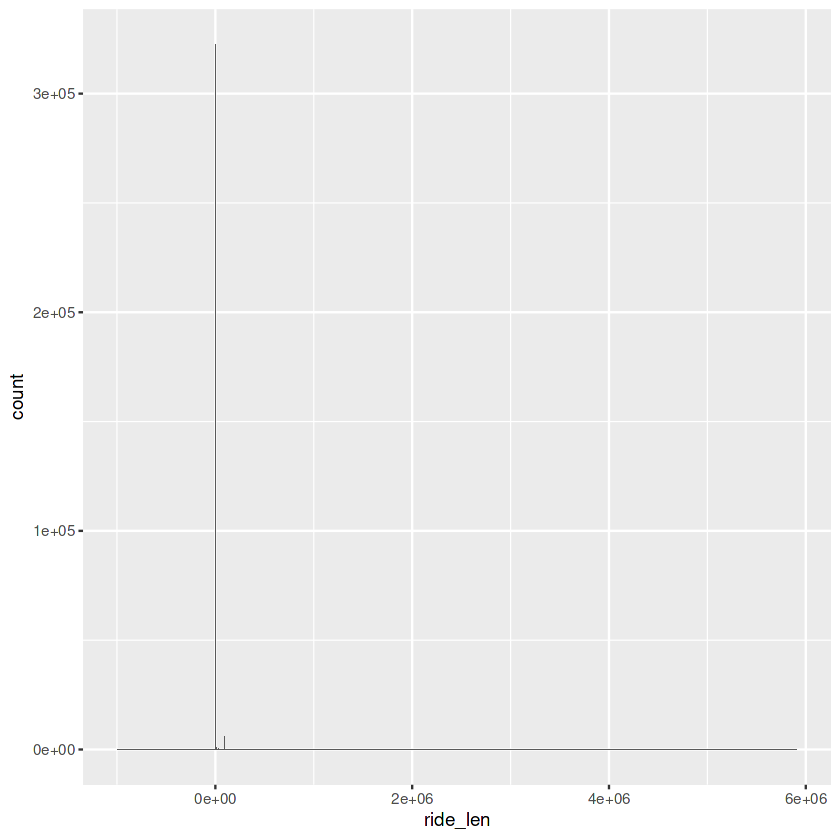

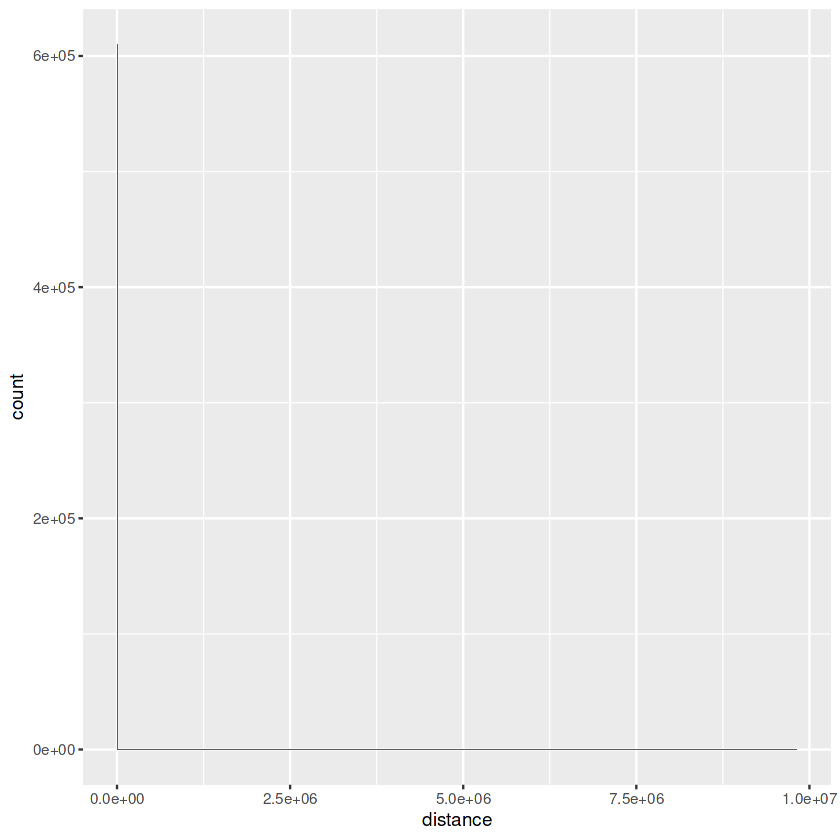

In [5]:

#get summary statistic of ride_length
summary(df$ride_len)
# let's plot the data and see how it looks 
ggplot(df,aes(x=ride_len)) + 
geom_histogram(binwidth=30)

#get summary statistic of distance
summary(df$distance)
# let's plot the data and see how it looks 
ggplot(df,aes(x=distance)) + 
geom_histogram(binwidth=30)

                               

**Oulier Detection**

In this analysis, as the distance is calculated using longitudes and latitudes of the start point and the end point, we cannot rely on distance as a concrete measure for understanding the difference between a casual customer and a member customer. Going forward, we will use ride duration (ride_len) as a measure for our analysis. 

    

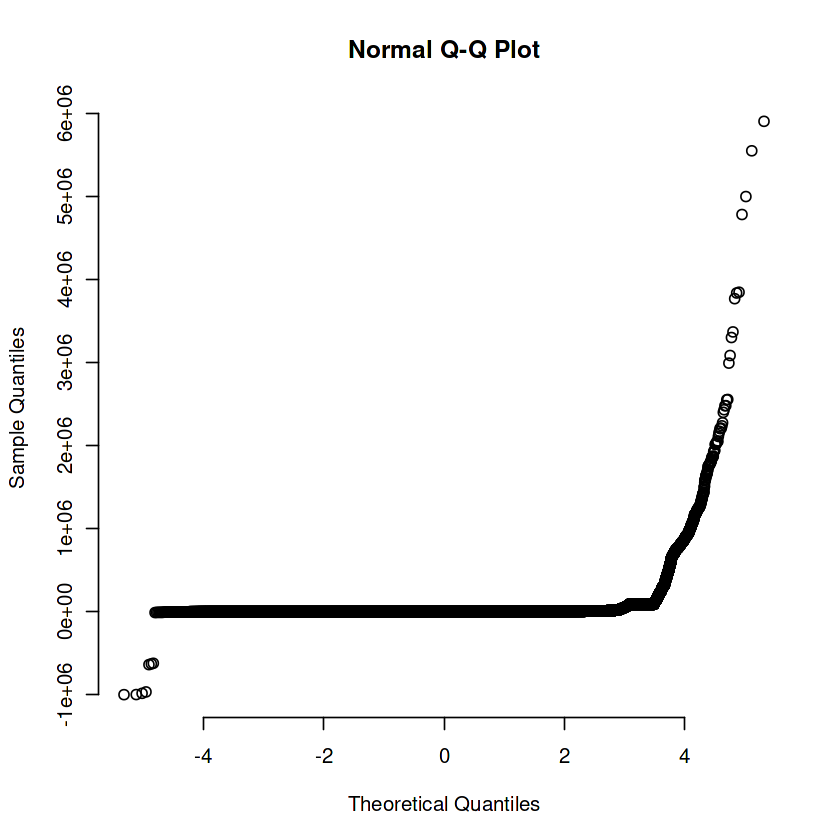

In [10]:
#Check if the ride_len is normally distributed. 
qqnorm(df$ride_len, pch = 1, frame = FALSE)

This makes sense as it expected to data will be skewed towards the right, as the most ride_len is will be always greater than zero secs

As the data is NOT normally distributed, we can use Inter Quantile Ranges of the data to remove "outliers".

In [11]:
# As we can see the in from the summary statistics of ride length there are absolute outliers
# we can use IQR to clean up our data and only include data that  falls within that range.

uplim <- quantile(df$ride_len, 0.975)
lolim <- quantile(df$ride_len, 0.025)

df_out_rm <- df %>%
        filter(ride_len >lolim &ride_len < uplim)

   ride_id          rideable_type        started_at                 
 Length:9169152     Length:9169152     Min.   :2022-06-01 00:00:04  
 Class :character   Class :character   1st Qu.:2022-09-02 19:12:39  
 Mode  :character   Mode  :character   Median :2023-04-03 16:34:13  
                                       Mean   :2023-02-22 23:41:36  
                                       3rd Qu.:2023-07-29 16:54:51  
                                       Max.   :2023-11-30 23:59:14  
                                                                    
    ended_at                   start_station_name start_station_id  
 Min.   :2022-06-01 00:02:38   Length:9169152     Length:9169152    
 1st Qu.:2022-09-02 19:26:57   Class :character   Class :character  
 Median :2023-04-03 16:45:38   Mode  :character   Mode  :character  
 Mean   :2023-02-22 23:54:52                                        
 3rd Qu.:2023-07-29 17:12:04                                        
 Max.   :2023-12-01 00:31:09      

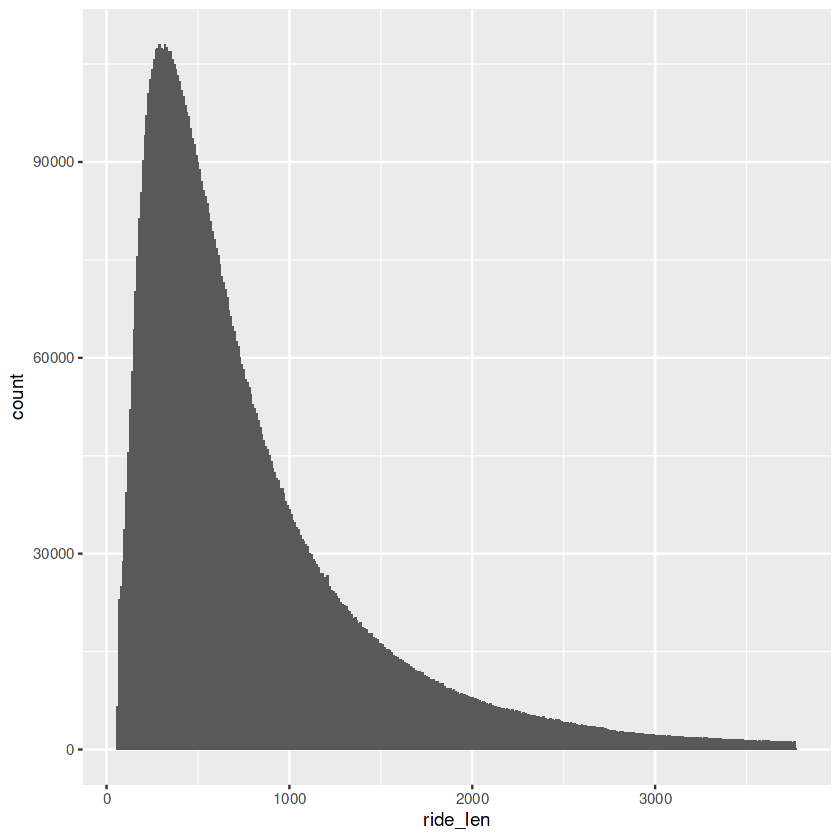

In [12]:
df_out_rm%>%
    ggplot(aes(x = ride_len)) +
    geom_histogram(binwidth = 10) 
summary (df_out_rm)


In [16]:
#sanity check
max(df_out_rm$ride_len)
min(df_out_rm$ride_len)


[1] 3767

[1] 63

After "outlier removal", we can see that the maximum ride duration is 3767 seconds(just over 1 hour) which seems like very short time period restrict our dataset. Does it make sense to cutoff the data here?

Lets put this in our business context, the casual members buy the day-pass which they can use for a day and they'll be charged extra for another day and the minimum ride duration is 60 secs, as anything below 60 secs is not considered a ride(likely due to improper docking). It makes more sense to include the data from 1 minute upto 24 hours.

(Further more, for one of the future  I have dropped the rows where stations names aren't available. The explanation for these missing values would be clarified in a real business case, as this is a fictional organization, it is out of the scope, which led to removal of 25% of the values)

In [5]:
# data without oulier removal only times restricted 0 to 24hours  
df_out <- df %>%
             drop_na(bike_type) %>% 
             filter(ride_len > 59 & ride_len < 86400)

 df_out_sp <- df_out %>%
              drop_na(bike_type) %>% 
              drop_na(start_station_name) %>%
              drop_na(end_station_name) %>%
              filter(ride_len > 59 & ride_len < 86400)

In [18]:
total_outlier <- length(df$ride_id) - length(df_out$ride_id)
outlier_perc  <- total_outlier/length(df$ride_id)*100
print(total_outlier)
cat("Percentage of outliers is", outlier_perc)
#length(df_wo_out$ride_id)           

[1] 246816
Percentage of outliers is 2.556621

   ride_id          rideable_type        started_at                 
 Length:9407177     Length:9407177     Min.   :2022-06-01 00:00:04  
 Class :character   Class :character   1st Qu.:2022-09-02 06:45:59  
 Mode  :character   Mode  :character   Median :2023-04-03 16:18:39  
                                       Mean   :2023-02-22 12:00:14  
                                       3rd Qu.:2023-07-29 14:24:19  
                                       Max.   :2023-11-30 23:59:14  
                                                                    
    ended_at                   start_station_name start_station_id  
 Min.   :2022-06-01 00:02:38   Length:9407177     Length:9407177    
 1st Qu.:2022-09-02 06:58:16   Class :character   Class :character  
 Median :2023-04-03 16:31:02   Mode  :character   Mode  :character  
 Mean   :2023-02-22 12:16:19                                        
 3rd Qu.:2023-07-29 14:48:16                                        
 Max.   :2023-12-01 09:47:35      

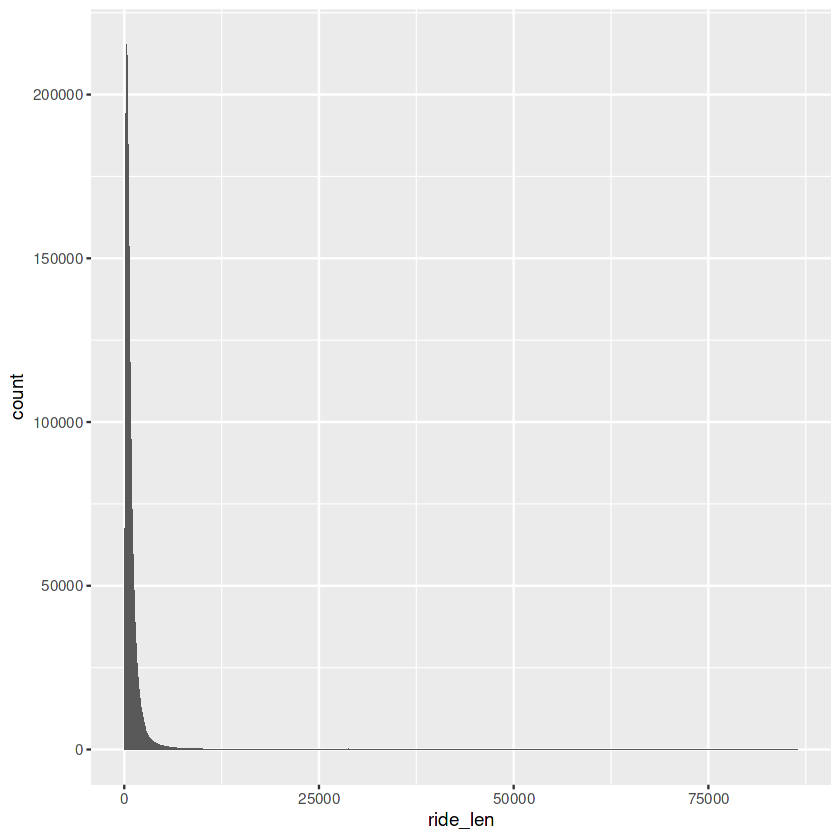

In [6]:
library(dplyr)
df_out%>%
         ggplot(aes(x =ride_len)) +
         geom_histogram(binwidth = 20) 

summary (df_out)
#df_wo_out2

## **<a id="ana">5. ANALYZE </a>**

*Key aims of this phase of the process is to analyze the given data to address out business task.*

In this phase, I used two datasets 
   1. filtered by duration between 1min and 24 hours
   2. filtered by duration (1min to 24 hours) and dropping all rows without station names

First we performed summary statistic by calculating count, mean, std, median etc. on these datasets and check for differences between member and casual rider. Following which we can take a closer look at customer behavior across diffeent weekdays.

This section contains:

1. Summary Statistics
2. Data Visualization and Statistics
3. Spatial Visualization

### **SUMMARY STATISTICS**

In [7]:
# Compare members and casual users
df1 <- df_out

In [7]:
library(knitr)
library(kableExtra)
library(IRdisplay)

df1 %>% 
    select(ride_len,member_casual1) %>% 
    group_by(member_casual1) %>%
    summarise(number=n(),
              Minimum =min(ride_len),
              Mean =mean(ride_len),
              Std = sd(ride_len),
              IQrange = IQR(ride_len),
              Median = median(ride_len),
              Maximum = max(ride_len),
               ) %>%
     kable("html", caption = "Summary statistic for ride duration :60s to 24 hours") %>%
     kable_classic(full_width = F) %>%
     as.character() %>%
     display_html()

df2 %>% 
    select(ride_len,member_casual1) %>% 
   group_by(member_casual1) %>%
   summarise(number=n(),
             Minimum =min(ride_len),
             Mean =mean(ride_len),
             Std = sd(ride_len),
             IQrange = IQR(ride_len),
             Median = median(ride_len),
             Maximum = max(ride_len),
             ) %>%
     kable("html", caption = "Summary statistic for ride duration:60s to 24 hours & filtered out NA station_id") %>%
     kable_classic(full_width = F) %>%
     as.character() %>%
     display_html()

   


Attaching package: ‘kableExtra’


The following object is masked from ‘package:dplyr’:

    group_rows




member_casual1,number,Minimum,Mean,Std,IQrange,Median,Maximum
casual,3694120,60,1289.0151,2500.157,951,754,86396
member,5713057,60,755.8807,1207.881,597,539,86395


member_casual1,number,Minimum,Mean,Std,IQrange,Median,Maximum
casual,2798776,60,1398.7563,2683.855,1031,803,86362
member,4431999,60,756.6233,1222.407,598,543,86392


In [8]:
# See the average ride time by each day for members vs casual users
df1$day_of_week <- ordered(df1$day_of_week, levels=c( "Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday","Sunday"))

day_mem <- df1 %>%
select(ride_len,member_casual1, day_of_week) %>% 
    group_by(member_casual1, day_of_week) %>%
    summarise(number=n()) %>%
    pivot_wider(names_from = day_of_week,
               values_from =number)
day_mem
    
#aggregate(df2$ride_len ~ df2$member_casual1 + df2$day_of_week, FUN = mean)

`summarise()` has grouped output by 'member_casual1'. You can override using
the `.groups` argument.


member_casual1,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday,Sunday
<chr>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
casual,415741,428370,450735,492713,560778,743186,602597
member,769678,885212,918684,921159,825600,749123,643601


In [8]:
df1 %>%
select(ride_len,member_casual1, day_of_week) %>% 
    group_by(day_of_week, member_casual1) %>%
    summarise(number=n(),
             AvgRide = mean(ride_len)) %>%
    pivot_wider(names_from = day_of_week,
               values_from =AvgRide)

`summarise()` has grouped output by 'day_of_week'. You can override using the
`.groups` argument.


member_casual1,number,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday,Sunday
<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
casual,415741,1272.3165,NA,NA,NA,NA,NA,NA
member,769678,717.5552,NA,NA,NA,NA,NA,NA
casual,428370,NA,1156.3302,NA,NA,NA,NA,NA
member,885212,NA,723.3396,NA,NA,NA,NA,NA
casual,450735,NA,NA,1109.5837,NA,NA,NA,NA
member,918684,NA,NA,721.3302,NA,NA,NA,NA
casual,492713,NA,NA,NA,1137.9352,NA,NA,NA
member,921159,NA,NA,NA,727.0119,NA,NA,NA
casual,560778,NA,NA,NA,NA,1248.6148,NA,NA


In [9]:
df1 %>% 
  mutate(weekday = wday(started_at, label = TRUE)) %>%  #creates weekday field using wday()
  group_by(member_casual1, weekday) %>%  #groups by usertype and weekday
  summarise( #calculates the number of rides and average duration 
           average_duration = mean(ride_len)) %>% # calculates the average duration
  arrange (weekday, member_casual1) %>%
  pivot_wider(names_from = weekday,
               values_from = average_duration)

`summarise()` has grouped output by 'member_casual1'. You can override using
the `.groups` argument.


member_casual1,Sun,Mon,Tue,Wed,Thu,Fri,Sat
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
casual,1489.5567,1272.3165,1156.3302,1109.5837,1137.9352,1248.6148,1451.7004
member,841.3064,717.5552,723.3396,721.3302,727.0119,751.2505,843.2901


### **DATA VISUALIZATION AND STATISTICS**

#### 1. Distribution of Ride Duration

There is clear distinction in the distribution of Ride Duration between casual and member riders. Casual riders tend to take a larger number of rides for longer periods of time.

PS: Interactive Tableau worksheet can be found [here](https://public.tableau.com/views/CyclisticProject-Capstone/DistributionofRideDuration?:language=en-US&publish=yes&:display_count=n&:origin=viz_share_link)

#### 1. A. Visualization

<div class='tableauPlaceholder' id='viz1705336308850' style='position: relative'><noscript><a href='#'><img alt=' ' src='https:&#47;&#47;public.tableau.com&#47;static&#47;images&#47;Cy&#47;CyclisticProject-Capstone&#47;DistributionofRideDuration&#47;1_rss.png' style='border: none' /></a></noscript><object class='tableauViz'  style='display:none;'><param name='host_url' value='https%3A%2F%2Fpublic.tableau.com%2F' /> <param name='embed_code_version' value='3' /> <param name='site_root' value='' /><param name='name' value='CyclisticProject-Capstone&#47;DistributionofRideDuration' /><param name='tabs' value='yes' /><param name='toolbar' value='yes' /><param name='static_image' value='https:&#47;&#47;public.tableau.com&#47;static&#47;images&#47;Cy&#47;CyclisticProject-Capstone&#47;DistributionofRideDuration&#47;1.png' /> <param name='animate_transition' value='yes' /><param name='display_static_image' value='yes' /><param name='display_spinner' value='yes' /><param name='display_overlay' value='yes' /><param name='display_count' value='yes' /><param name='language' value='en-US' /><param name='filter' value='publish=yes' /></object></div>                <script type='text/javascript'>                    var divElement = document.getElementById('viz1705336308850');                    var vizElement = divElement.getElementsByTagName('object')[0];                    vizElement.style.width='100%';vizElement.style.height=(divElement.offsetWidth*0.75)+'px';                    var scriptElement = document.createElement('script');                    scriptElement.src = 'https://public.tableau.com/javascripts/api/viz_v1.js';                    vizElement.parentNode.insertBefore(scriptElement, vizElement);                </script>

#### 1. B. Statistics
1. Test for normality: 

   Use ***kolmogorov smirnov test*** to determine normality of ride duration data. KS test is non-parametric test in which the null hypothesis is that the distribution is normal. So if the p-value <0.05, we can say that our distribution is not normal. 

In [7]:
# test for normality of the ride duration data
ks.test(x=df1$ride_len,y='pnorm',alternative='two.sided')

Warning message in ks.test(x = df1$ride_len, y = "pnorm", alternative = "two.sided"):
“ties should not be present for the Kolmogorov-Smirnov test”



	One-sample Kolmogorov-Smirnov test

data:  df1$ride_len
D = 1, p-value < 2.2e-16
alternative hypothesis: two-sided


#### 2. Average Ride Duration
There is difference betweeen the ride length between in Casual Riders and Membership riders. Casual riders go on longer riders compared to members.


PS: Interactive Tableau worksheet can be found [here](https://public.tableau.com/views/CyclisticProject-Capstone/AverageRideDuration?:language=en-US&publish=yes&:display_count=n&:origin=viz_share_link)


#### 2. A. Visualization

<div class='tableauPlaceholder' id='viz1704653791461' style='position: relative'><noscript><a href='#'><img alt=' ' src='https:&#47;&#47;public.tableau.com&#47;static&#47;images&#47;Cy&#47;CyclisticProject-Capstone&#47;AverageRideDuration&#47;1_rss.png' style='border: none' /></a></noscript><object class='tableauViz'  style='display:none;'><param name='host_url' value='https%3A%2F%2Fpublic.tableau.com%2F' /> <param name='embed_code_version' value='3' /> <param name='path' value='views&#47;CyclisticProject-Capstone&#47;AverageRideDuration?:language=en-US&amp;:embed=true' /> <param name='toolbar' value='yes' /><param name='static_image' value='https:&#47;&#47;public.tableau.com&#47;static&#47;images&#47;Cy&#47;CyclisticProject-Capstone&#47;AverageRideDuration&#47;1.png' /> <param name='animate_transition' value='yes' /><param name='display_static_image' value='yes' /><param name='display_spinner' value='yes' /><param name='display_overlay' value='yes' /><param name='display_count' value='yes' /><param name='language' value='en-US' /></object></div>                <script type='text/javascript'>                    var divElement = document.getElementById('viz1704653791461');                    var vizElement = divElement.getElementsByTagName('object')[0];                    vizElement.style.width='100%';vizElement.style.height=(divElement.offsetWidth*0.75)+'px';                    var scriptElement = document.createElement('script');                    scriptElement.src = 'https://public.tableau.com/javascripts/api/viz_v1.js';                    vizElement.parentNode.insertBefore(scriptElement, vizElement);                </script>

#### 2. B. Statistics
2. 2. 1. To compare the average ride duration of casual vs member customer
   
   Use ***Mann-Whitney-Wilcoxon Test***  to compare the means of two populations. The MW Test is a non parametric test, which analogus to t-test in comparing means.

In [19]:
# data is not normal,so use Mann Whitney U test
df1 %>%  wilcox.test(data=.,ride_len ~ member_casual1, alternative='greater') 


	Wilcoxon rank sum test with continuity correction

data:  ride_len by member_casual1
W = 1.3107e+13, p-value < 2.2e-16
alternative hypothesis: true location shift is greater than 0


#### 3. Number of rides by months (Over 1 year)

The number of rides significantly increase during the summer season (April to October) compared to winter seasons. Although the number of rides taken by members and casual riders increase, there is significant difference between the two distributions.

#### 3. A. Visualizations

Interactive Tableau worksheet can be found [here](https://public.tableau.com/views/CyclisticProject-Capstone/NumRides_Jun22toMay23?:language=en-US&:display_count=n&:origin=viz_share_link)

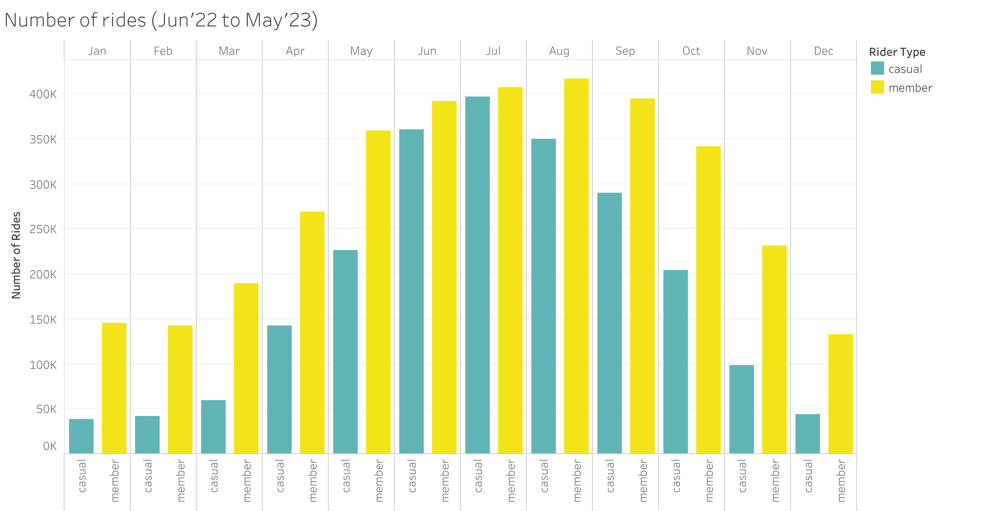

Interactive Tableau dashboard can be found [here](https://public.tableau.com/views/CyclisticProject-Capstone/Dashboard4?:language=en-US&:display_count=n&:origin=viz_share_link)

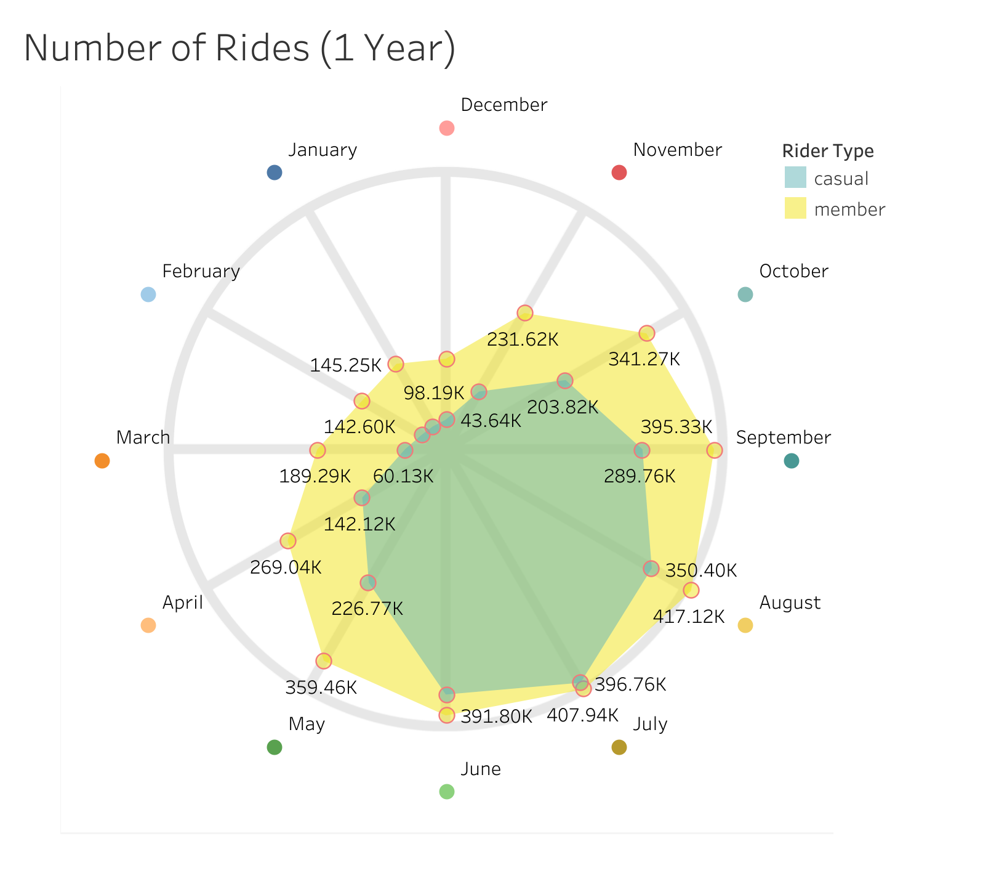

#### 3. B. Statistics

In [13]:
df1$month <- as.factor(df1$month)
df1_member<- df1%>%
             filter(member_casual1 == 'member') 
df1_casual<- df1%>%
             filter(member_casual1 == 'casual') 

3. 2. 1. Use **Chi Squared test** for independence to check whether the frequency of rides over months differ between casual riders and members.


In [10]:
freq_ride <- table(df1$member_casual1, df1$month)
model <- chisq.test(freq_ride)
model


	Pearson's Chi-squared test

data:  freq_ride
X-squared = 194484, df = 11, p-value < 2.2e-16


#### 4. Average ride duration over months


Casual riders take significantly longer rides than members (see statistics) and the ride duration increases over the months April to October. Although the ride duration for members does not increase as drastically as casual riders during the months of April to October, there is a signicant increase in the ride duration during those months.

#### 4. A. Visualizations

The interactive Tableau worksheet can be found [here](https://public.tableau.com/views/CyclisticProject-Capstone/Avg_RideDurationOverMonths?:language=en-US&:display_count=n&:origin=viz_share_link)

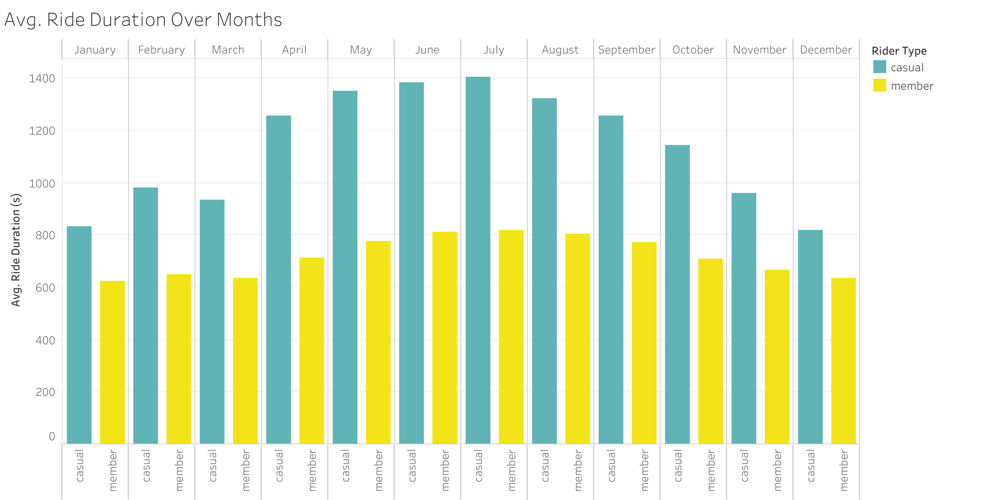

The interactive Tableau dashboard can be found [here](https://public.tableau.com/views/CyclisticProject-Capstone/AvgDuration_monthsRadar?:language=en-US&:display_count=n&:origin=viz_share_link).

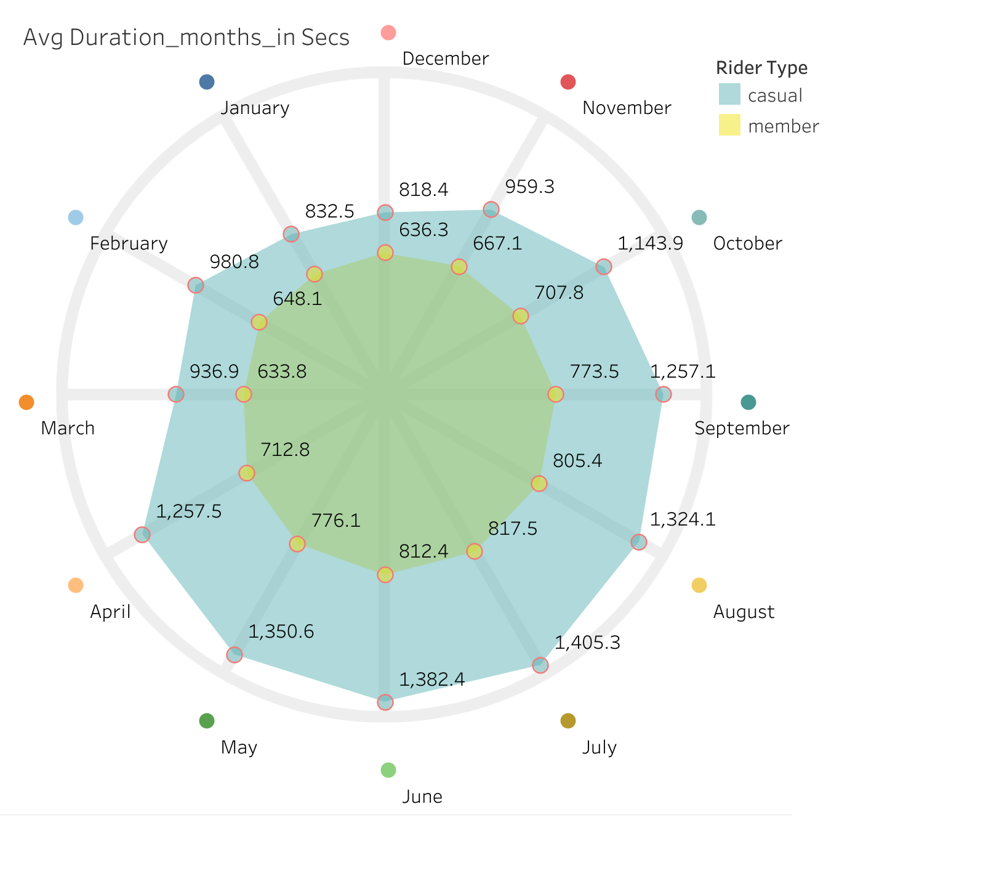

#### 4. B. Statistics

4. 2. 1. To check the difference between average ride duration over months    
   Use **Kruskall Walis Test** to see if there is difference in mean over multiple comparsions (non parametric test.) This test is analogus to One-Way ANOVA.
   
      2.  To check the difference in the mean ride duration in either member or casual riders over the months.
          Use **Pairwise Wilcox Test**  to check difference in month of a particular category.

In [11]:
#member only ride duration over months
kruskal.test(df1_member$ride_len ~ df1_member$month)
pairwise.wilcox.test(df1_member$ride_len, df1_member$month, p.adjust.method = "BH") 


	Kruskal-Wallis rank sum test

data:  df1_member$ride_len by df1_member$month
Kruskal-Wallis chi-squared = 88510, df = 11, p-value < 2.2e-16



	Pairwise comparisons using Wilcoxon rank sum test with continuity correction 

data:  df1_member$ride_len and df1_member$month 

   01      02      03      04      05      06      07      08      09     
02 4.2e-14 -       -       -       -       -       -       -       -      
03 < 2e-16 0.02106 -       -       -       -       -       -       -      
04 < 2e-16 < 2e-16 < 2e-16 -       -       -       -       -       -      
05 < 2e-16 < 2e-16 < 2e-16 < 2e-16 -       -       -       -       -      
06 < 2e-16 < 2e-16 < 2e-16 < 2e-16 < 2e-16 -       -       -       -      
07 < 2e-16 < 2e-16 < 2e-16 < 2e-16 < 2e-16 0.00122 -       -       -      
08 < 2e-16 < 2e-16 < 2e-16 < 2e-16 < 2e-16 < 2e-16 < 2e-16 -       -      
09 < 2e-16 < 2e-16 < 2e-16 < 2e-16 1.7e-13 < 2e-16 < 2e-16 < 2e-16 -      
10 < 2e-16 < 2e-16 < 2e-16 0.01344 < 2e-16 < 2e-16 < 2e-16 < 2e-16 < 2e-16
11 < 2e-16 < 2e-16 < 2e-16 < 2e-16 < 2e-16 < 2e-16 < 2e-16 < 2e-16 < 2e-16
12 < 2e-16 0.00032 0.12913 < 2e-16 < 2e-16 <

In [14]:
#casual only ride duration over months
kruskal.test(df1_casual$ride_len ~ df1_casual$month)
pairwise.wilcox.test(df1_casual$ride_len, df1_casual$month, p.adjust.method = "BH") 


	Kruskal-Wallis rank sum test

data:  df1_casual$ride_len by df1_casual$month
Kruskal-Wallis chi-squared = 84899, df = 11, p-value < 2.2e-16



	Pairwise comparisons using Wilcoxon rank sum test with continuity correction 

data:  df1_casual$ride_len and df1_casual$month 

   01      02      03      04      05      06      07      08      09     
02 < 2e-16 -       -       -       -       -       -       -       -      
03 < 2e-16 0.50    -       -       -       -       -       -       -      
04 < 2e-16 < 2e-16 < 2e-16 -       -       -       -       -       -      
05 < 2e-16 < 2e-16 < 2e-16 < 2e-16 -       -       -       -       -      
06 < 2e-16 < 2e-16 < 2e-16 < 2e-16 < 2e-16 -       -       -       -      
07 < 2e-16 < 2e-16 < 2e-16 < 2e-16 < 2e-16 7.4e-08 -       -       -      
08 < 2e-16 < 2e-16 < 2e-16 < 2e-16 0.11    < 2e-16 < 2e-16 -       -      
09 < 2e-16 < 2e-16 < 2e-16 < 2e-16 < 2e-16 < 2e-16 < 2e-16 < 2e-16 -      
10 < 2e-16 < 2e-16 < 2e-16 < 2e-16 < 2e-16 < 2e-16 < 2e-16 < 2e-16 < 2e-16
11 < 2e-16 < 2e-16 < 2e-16 < 2e-16 < 2e-16 < 2e-16 < 2e-16 < 2e-16 < 2e-16
12 8.0e-11 < 2e-16 < 2e-16 < 2e-16 < 2e-16 <

4. 2. 3. Compare the difference between rider types in each month.(Use Man Whitney U test)


In [52]:
months = sort(unique(df1$month), decreasing = FALSE)

for (m in 1:12){
    h <-df1%>%
        filter(month == months[m]) %>%
        wilcox.test(data=.,ride_len ~ member_casual1)
    print(h)
}


	Wilcoxon rank sum test with continuity correction

data:  ride_len by member_casual1
W = 3076103798, p-value < 2.2e-16
alternative hypothesis: true location shift is not equal to 0


	Wilcoxon rank sum test with continuity correction

data:  ride_len by member_casual1
W = 3441897498, p-value < 2.2e-16
alternative hypothesis: true location shift is not equal to 0


	Wilcoxon rank sum test with continuity correction

data:  ride_len by member_casual1
W = 6558149053, p-value < 2.2e-16
alternative hypothesis: true location shift is not equal to 0


	Wilcoxon rank sum test with continuity correction

data:  ride_len by member_casual1
W = 2.3793e+10, p-value < 2.2e-16
alternative hypothesis: true location shift is not equal to 0


	Wilcoxon rank sum test with continuity correction

data:  ride_len by member_casual1
W = 5.1128e+10, p-value < 2.2e-16
alternative hypothesis: true location shift is not equal to 0


	Wilcoxon rank sum test with continuity correction

data:  ride_len by member_c

#### 5. Number of rides over days of the week  

The distribution of number of rides taken by casual riders significantly differs from the members riders. The number od rides rises during the weekend for casual riders, versus members take more rides during the week.

#### 5. A. Visualization

`summarise()` has grouped output by 'member_casual1'. You can override using
the `.groups` argument.


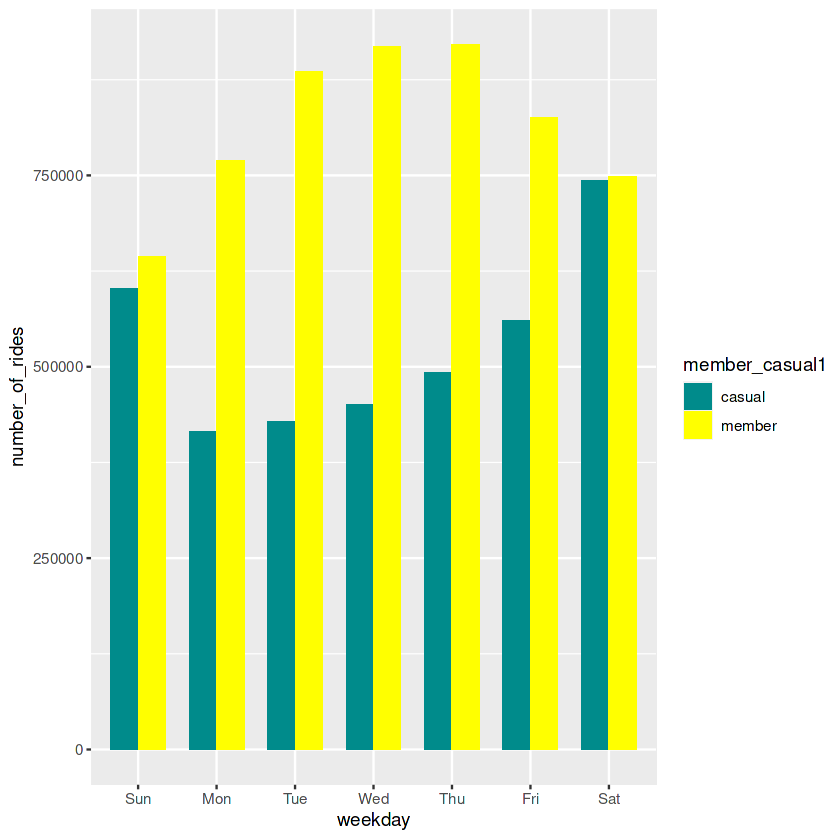

In [54]:
# Let's visualize the number of rides by rider type for different days of the week
df1 %>% 
  mutate(weekday = wday(started_at, label = TRUE)) %>% 
  group_by(member_casual1, weekday) %>% 
  summarise(number_of_rides = n()
            ,average_duration = mean(ride_len)) %>% 
  arrange(member_casual1, weekday)  %>% 
  ggplot(aes(x = weekday, y = number_of_rides, fill = member_casual1)) +
  geom_col(width=.7,position = "dodge")+scale_fill_manual(values = c("darkcyan", "yellow"))


The interactive dashboard link can be found [here](https://public.tableau.com/views/CyclisticProject-Capstone/Numberofrides_overweekdays?:language=en-US&:display_count=n&:origin=viz_share_link).

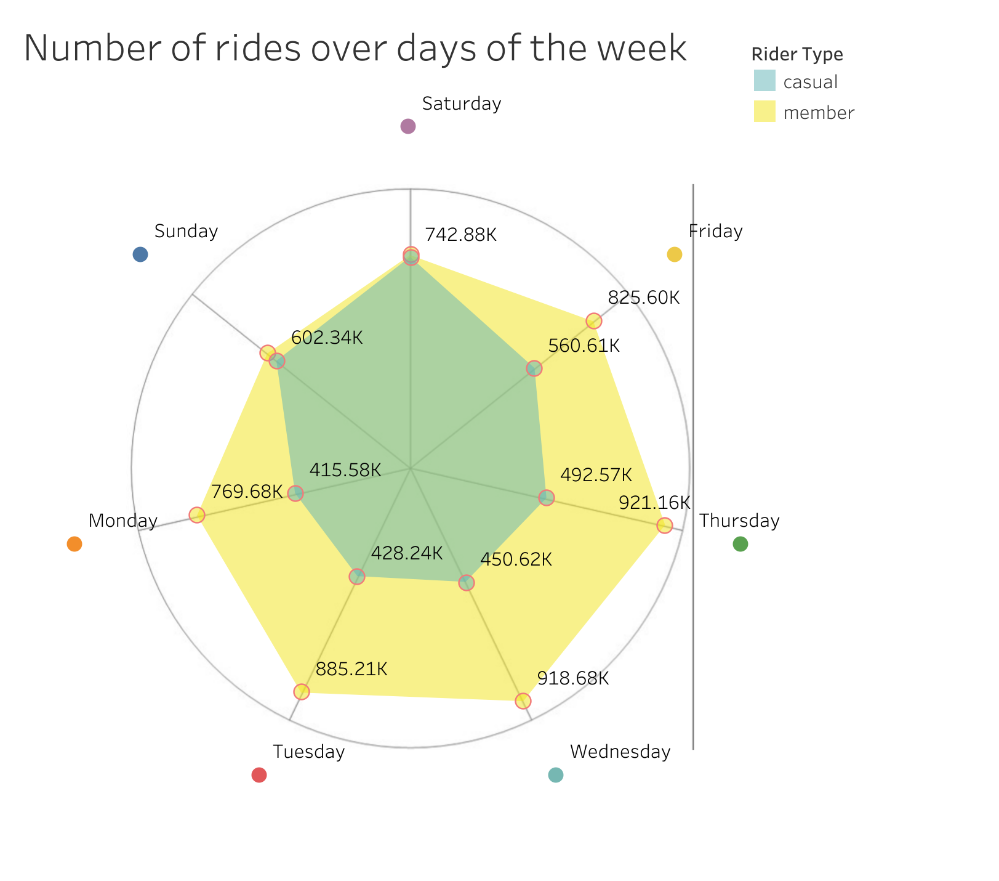

#### 5. B. Statistics

In [56]:
#Chi-Sqaured test of independence
freq_ride <- table(df1$member_casual1, df1$day_of_week)
model <- chisq.test(freq_ride)
model


	Pearson's Chi-squared test

data:  freq_ride
X-squared = 181307, df = 6, p-value < 2.2e-16


#### 6. Average ride duration over days of the week

Average ride duration for casual riders is consistently and significantly larger than member riders. 

`summarise()` has grouped output by 'member_casual1'. You can override using
the `.groups` argument.


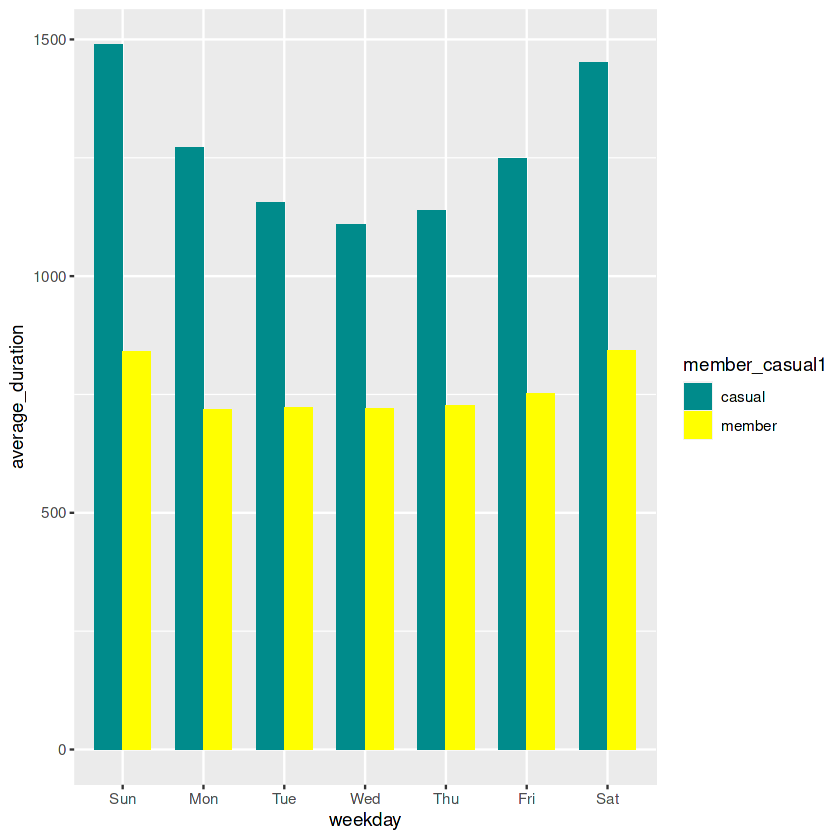

In [55]:
# Let's create a visualization for average duration
df1 %>% 
  mutate(weekday = wday(started_at, label = TRUE)) %>% 
  group_by(member_casual1, weekday) %>% 
  summarise(number_of_rides = n()
            ,average_duration = mean(ride_len)) %>% 
        arrange(member_casual1, weekday)  %>% 
  ggplot(aes(x = weekday, y = average_duration, fill = member_casual1)) +
  geom_col(width=.7,position = "dodge")+scale_fill_manual(values = c("darkcyan", "yellow"))


The inteactive dashboard can be found [here](https://public.tableau.com/views/CyclisticProject-Capstone/AvgRideDurationoverWeekdays?:language=en-US&:display_count=n&:origin=viz_share_link).

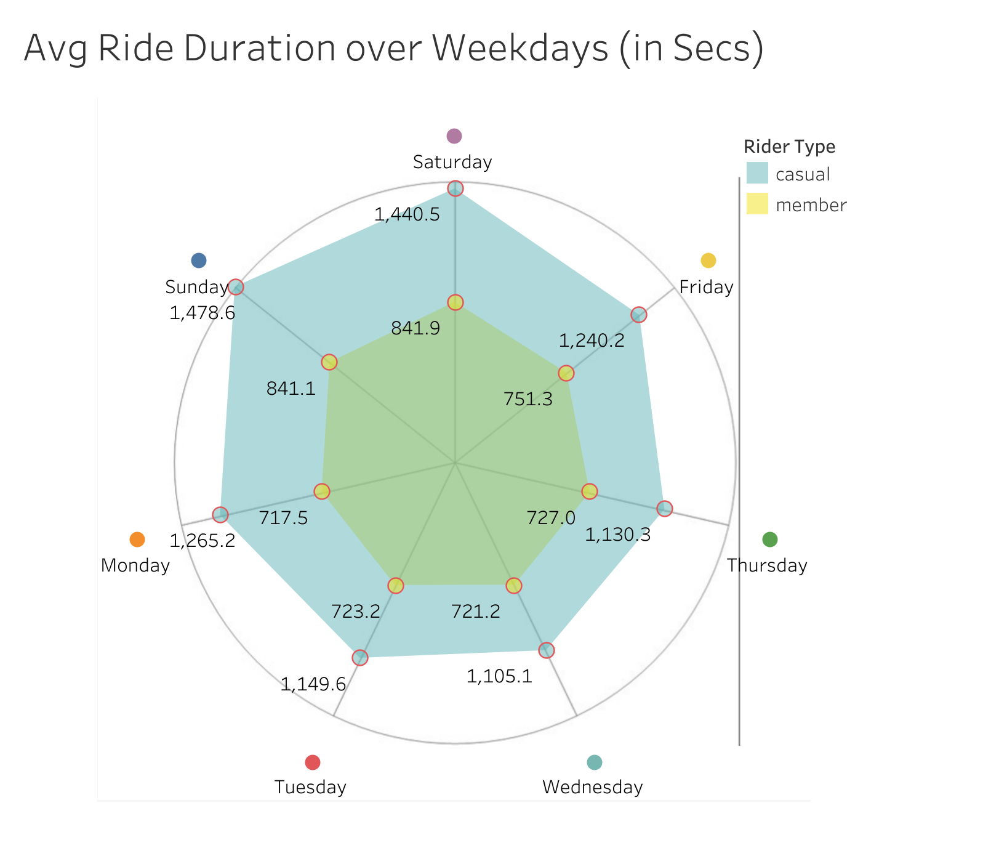

#### 6. B. Statistics

In [25]:
#Comparing the days of week for members
kruskal.test(df1_member$ride_len ~ df1_member$day_of_week)
pairwise.wilcox.test(df1_member$ride_len, df1_member$day_of_week, p.adjust.method = "BH") 


	Pairwise comparisons using Wilcoxon rank sum test with continuity correction 

data:  df1_member$ride_len and df1_member$day_of_week 

          Monday  Tuesday Wednesday Thursday Friday  Saturday
Tuesday   < 2e-16 -       -         -        -       -       
Wednesday < 2e-16 3.8e-06 -         -        -       -       
Thursday  < 2e-16 < 2e-16 1.8e-06   -        -       -       
Friday    < 2e-16 < 2e-16 < 2e-16   < 2e-16  -       -       
Saturday  < 2e-16 < 2e-16 < 2e-16   < 2e-16  < 2e-16 -       
Sunday    < 2e-16 < 2e-16 < 2e-16   < 2e-16  < 2e-16 < 2e-16 

P value adjustment method: BH 

In [27]:
#Comparing the days of week for members
kruskal.test(df1_casual$ride_len ~ df1_casual$day_of_week)
pairwise.wilcox.test(df1_casual$ride_len, df1_casual$day_of_week, p.adjust.method = "BH") 


	Kruskal-Wallis rank sum test

data:  df1_casual$ride_len by df1_casual$day_of_week
Kruskal-Wallis chi-squared = 57569, df = 6, p-value < 2.2e-16



	Pairwise comparisons using Wilcoxon rank sum test with continuity correction 

data:  df1_casual$ride_len and df1_casual$day_of_week 

          Monday Tuesday Wednesday Thursday Friday Saturday
Tuesday   <2e-16 -       -         -        -      -       
Wednesday <2e-16 <2e-16  -         -        -      -       
Thursday  <2e-16 0.2232  <2e-16    -        -      -       
Friday    <2e-16 <2e-16  <2e-16    <2e-16   -      -       
Saturday  <2e-16 <2e-16  <2e-16    <2e-16   <2e-16 -       
Sunday    <2e-16 <2e-16  <2e-16    <2e-16   <2e-16 0.0021  

P value adjustment method: BH 

### **SPATIAL VISUALIZATION**

In [10]:
#create start station and end station, remove white spaces to avoid duplicates 
df_out_sp$start_station <- str_squish(df_out_sp$start_station_name)
df_out_sp$end_station<- str_squish(df_out_sp$end_station_name)
#concatenate the start and end to creat a route variable 
df_out_sp$route <- paste(df_out_sp$start_station,"-",df_out_sp$end_station)

In [11]:
# save the route as factor
df2<- df_out_sp
df2$route <- as.factor(df2$route)

In [ ]:
# Summary table counting routes by member casual divide
df2 %>% 
            group_by(route, member_casual1) %>%
            summarize (number= n())
    pivot_wider(names_from = route,
               values_from =number)

In [21]:
#create dataframes with number of start and end stations  and mean lat and long for easier ploting
start_station_df<- df2 %>%
                        group_by(start_station,member_casual1) %>%
                        summarise(count = n(),
                        avg_st_lat = mean(start_lat),
                        avg_st_lng = mean(start_lng)) 
          
end_station_df <- df2 %>%
                        group_by(end_station,member_casual1) %>%
                        summarise(count = n(),
                        avg_en_lat = mean(end_lat),
                        avg_en_lng = mean(end_lng)) 

`summarise()` has grouped output by 'start_station'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'end_station'. You can override using the
`.groups` argument.


In [23]:
#create route dataframe  with route and lat and long for each route
route_df <-  df2 %>%
                 group_by(start_station,end_station,member_casual1) %>%
                 summarise(count = n(),
                 avg_st_lat = mean(start_lat),
                 avg_en_lat = mean(end_lat),
                 avg_st_lng = mean(start_lng),
                 avg_en_lng = mean(end_lng)) 

`summarise()` has grouped output by 'start_station', 'end_station'. You can
override using the `.groups` argument.


In [22]:
#save the dataframes in file to visualize in Tableau
write.csv(start_station_df, file = 'data_start_spatial.csv')
write.csv(end_station_df, file = 'data_end_spatial.csv')
write.csv(route_df, file = 'data_route_spatial.csv')

#### 7. Origin stations

The interactive spatial map can be found here- [Origin_station_Map](https://public.tableau.com/shared/GHBDTGJSH?:display_count=n&:origin=viz_share_link).

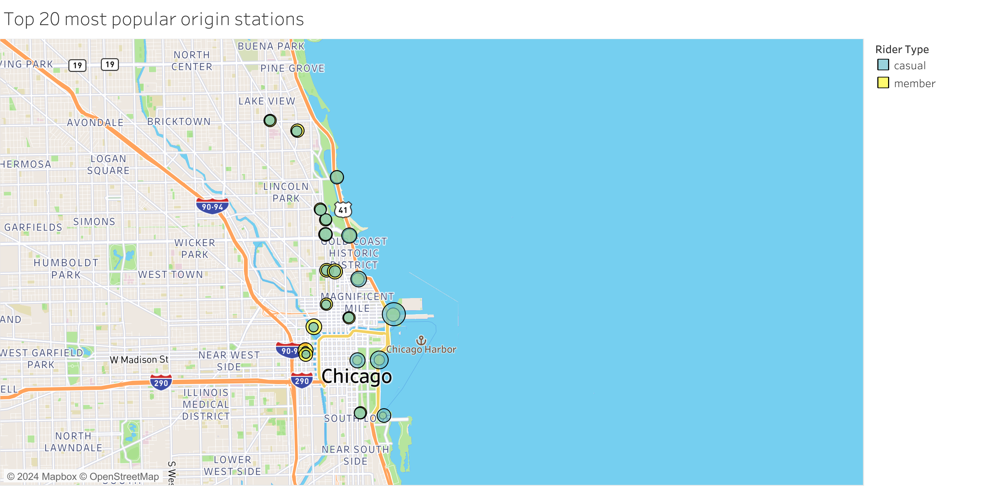

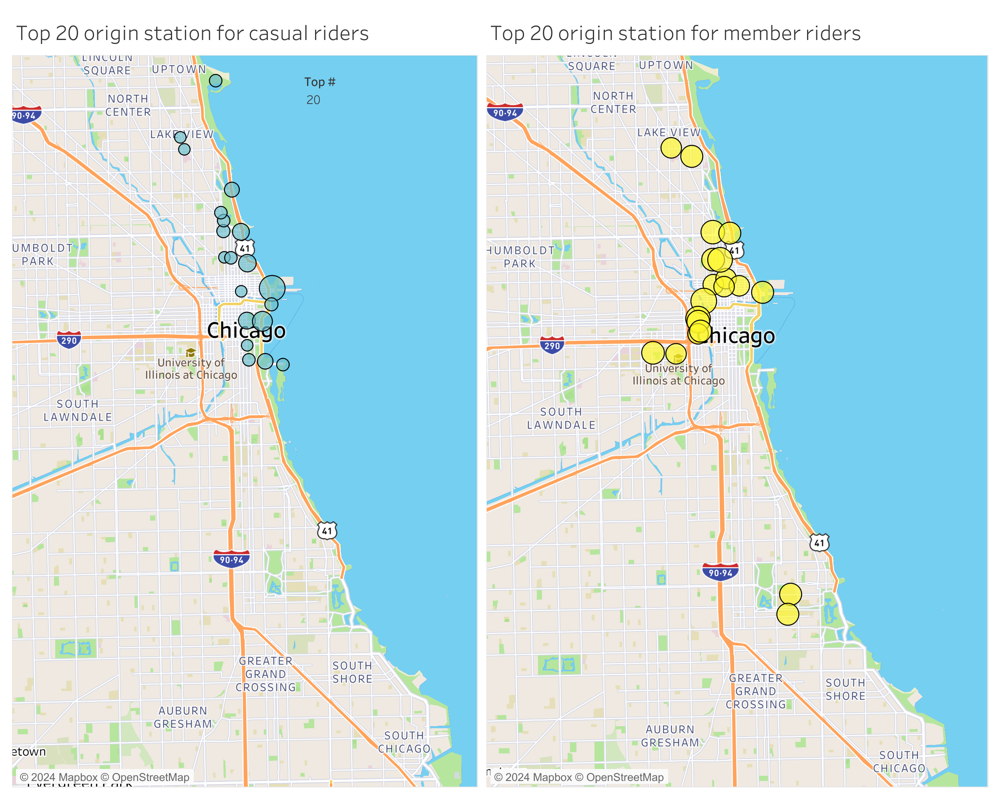

#### 8. Destination stations

The interactive spatial map can be found here- [Destination_station_map.](https://public.tableau.com/shared/R4PDBPKPT?:display_count=n&:origin=viz_share_link)

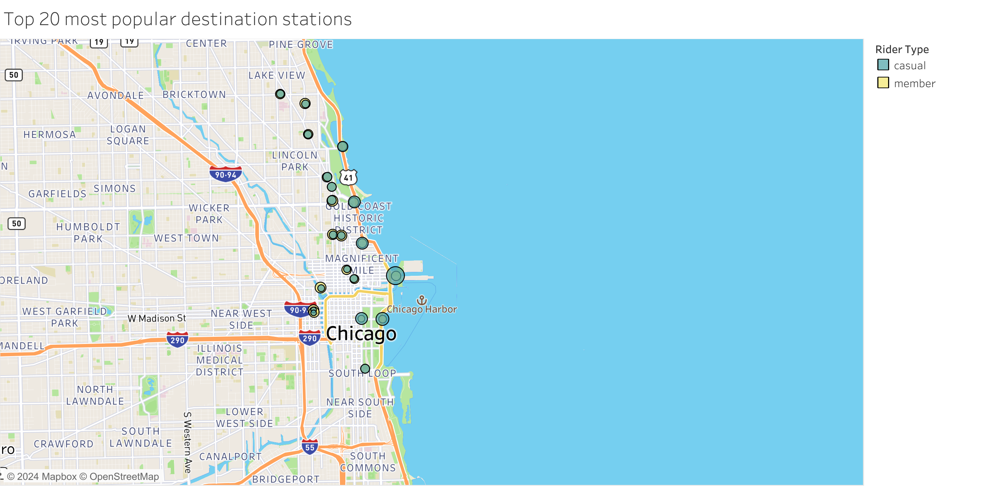

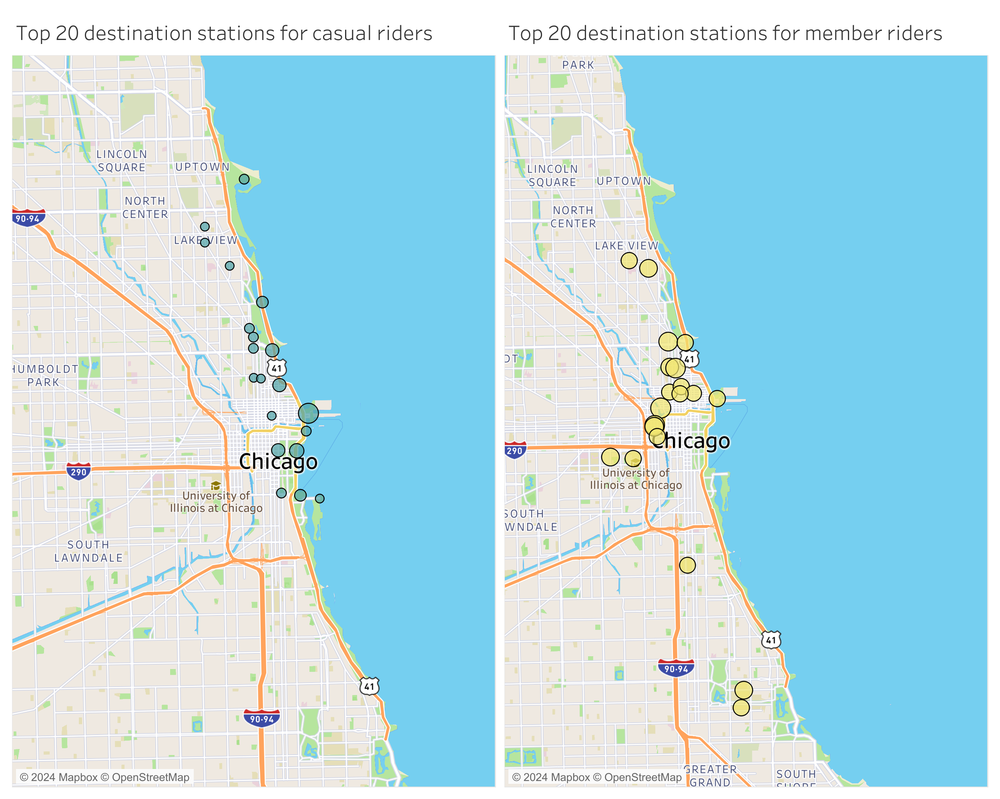

#### 9. Routes

The interactive chart can be found [here.](https://public.tableau.com/views/CyclisticRoute/RouteCounts?:language=en-US&:display_count=n&:origin=viz_share_link)

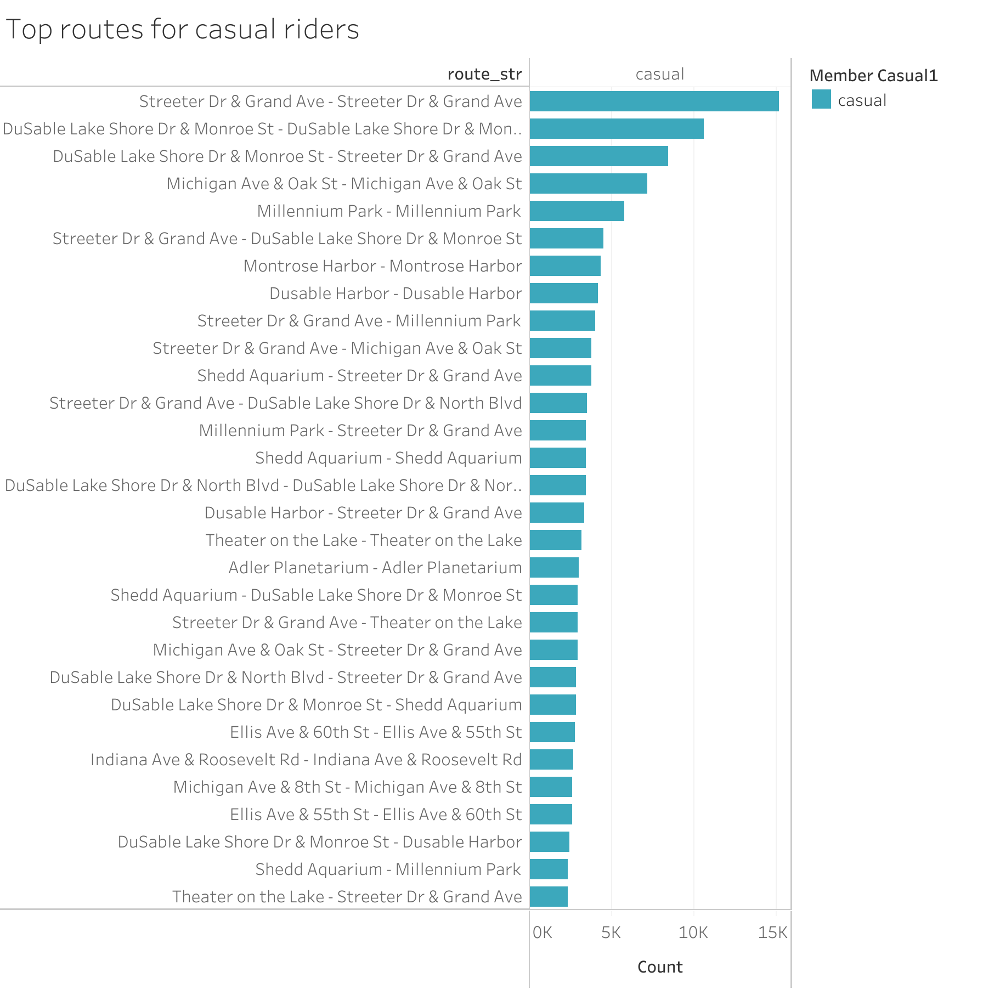

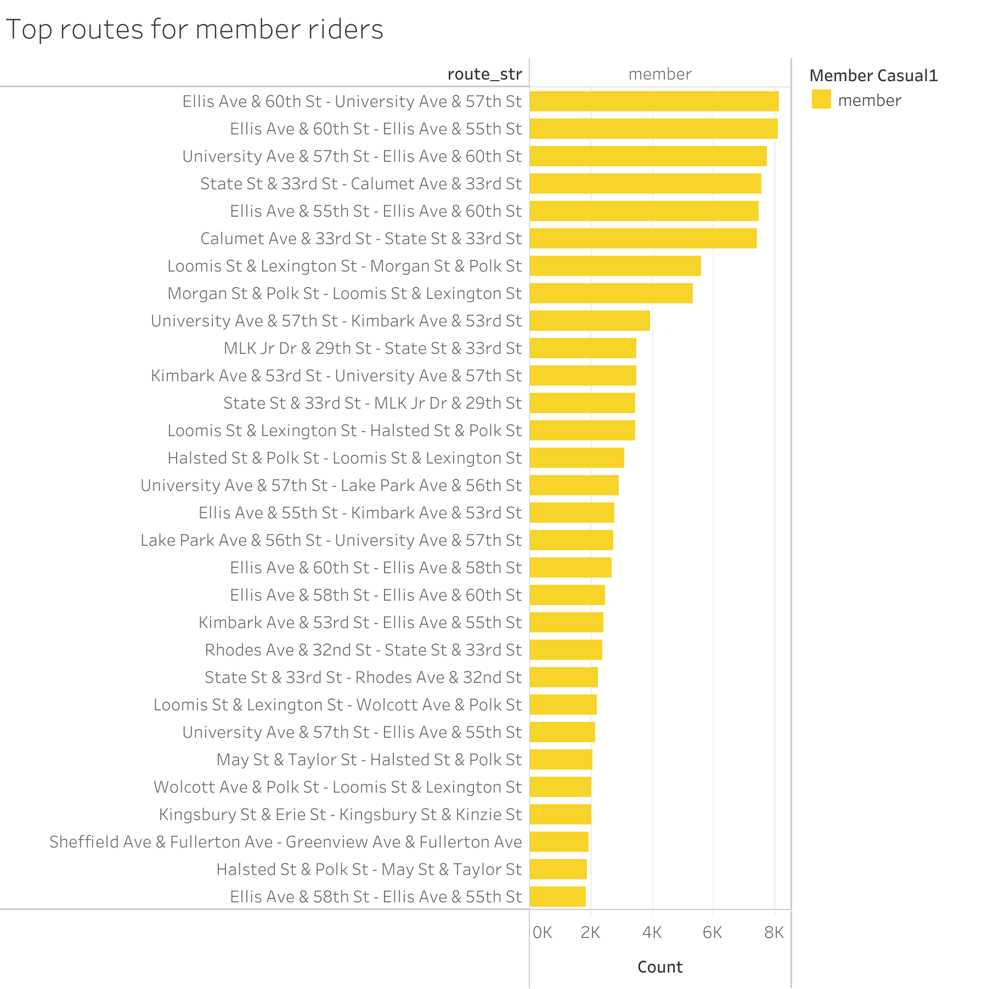

The interactive spatial map to view the most popular routes can be found here - [route_spatial_map.](https://public.tableau.com/shared/NT8JFS2JZ?:display_count=n&:origin=viz_share_link) 

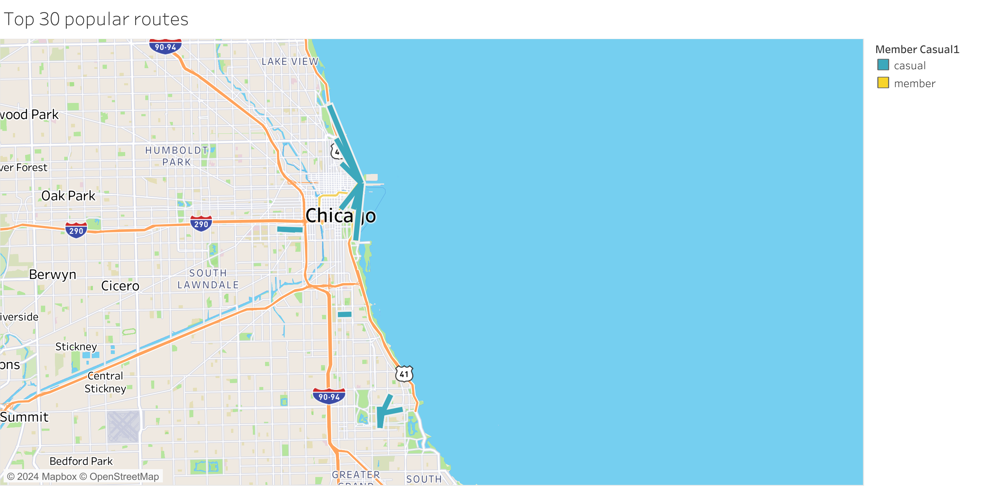

## **<a id="share">6. SHARE </a>**

Key aim of this phase is to share the key findings of the project and provide visualizations supporting those key findings.

The key findings of this project are as follows:

1. Casual riders on average take significantly longer rides compared to member riders.
2. Number of casual riders significantly higher during the months of April to October, compared to months of Nov- March.
3. Number of casual riders significantly higher on the weekends compared to weekdays.
4. The top origin stations for casual riders is tend to be in downtown area.

#### 1. Differences in casual riders vs member riders  

Casual riders take longer rides compared to member riders. Although the number of member riders significantly surpasses casual riders, we see increase in riders during warmer months(April to Oct) and during the weekends.

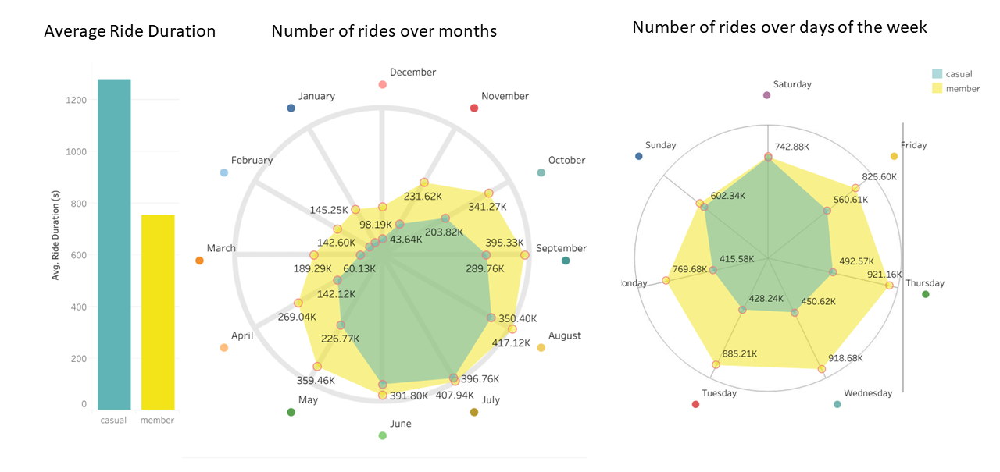

#### 2. Top origin stations for casual riders vs member riders 

The top 20 origin stattions for casual riders seems to concentrate in downtown area and tourist areas. Member riders show more ridership in farther away areas eg. university. 

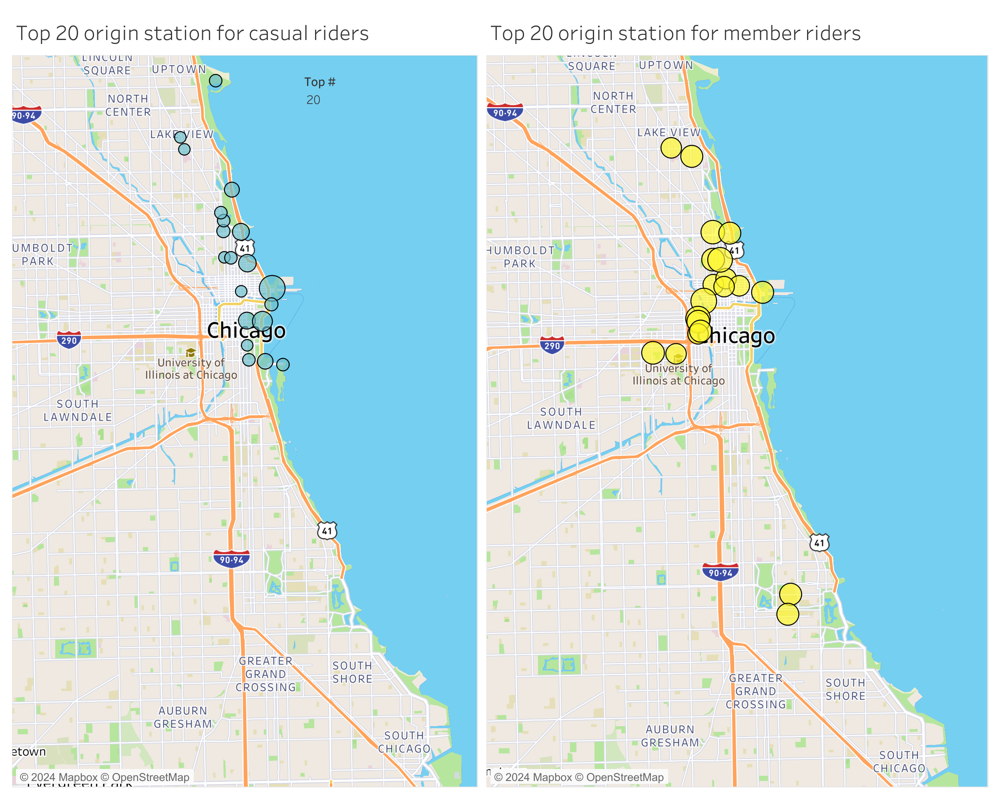

## **<a id="act">7. ACT </a>**

Key aim of this phase is to provide the summary of the project and key recommendations to the stakeholders.

### ***Business Task*:** 
    Idetintifying the key differences between casual riders and member riders

### ***Key findings*:**

1. Casual riders on average take significantly longer rides compared to member riders.
2. Number of casual riders significantly increase during the months of April to October, 
   (compared to months of Nov- March) and on the weekends(compared to weekdays).
3. The top origin stations for casual riders is tend to be in downtown area.

### ***Recommendations:***

1. Offer discounted rates in mmeberships for a set initial period of time (i.e 15mins or 30mins discount pass) 
2. Offer seasonal membership passes for months of April to October.
3. Offer weekend discounts to members
4. More advertising and geographical zone based pricing in downtown and touristy areas.

## **<a id="con">8. CONCLUSION </a>**

In this capstone project of the Google Data Analytics Course Certificate, I have finished the case study following the framework set in the course: Ask, Prepare, Process, Analyze, Share, Act.

In this case study, I analysed the key the differences between riders with membership subscriptions and casual riders with day passes. In this project, I identified the business question, obtained the data, cleaned the data for analysis , performed exploratory data analysis and futher analyzed the data and performed statistics. Subsquently, I made summary to share key findings with visualizations(created in Tableau). Consquently, I provided recommendations to implement to convert casual rider to members.

In conclusion, I have finished the project and gained good understanding of Tableau and honed my skills in R. 
